In [1]:
import numpy as np
import matplotlib.pyplot as plt

import torch
from torchvision import transforms
from PIL import Image

img = Image.open('test.png')
# p = transforms.Compose([transforms.Resize((400,600))])

# img = p(img)
img = torch.tensor(np.array(img)/255,dtype=torch.float32)
img = img.permute([2,0,1])
img = img[None,...]

In [2]:
hk = torch.tensor([1.,-1.])[None,None,:,None].tile(3,1,1,1)
vk = torch.tensor([-1.,1.])[None,None,None,:].tile(3,1,1,1)

In [3]:
vd_image = torch.max(torch.nn.functional.conv2d(img,vk,padding='same',groups=3),dim=1)[0]
hd_image = torch.max(torch.nn.functional.conv2d(img,hk,padding='same',groups=3),dim=1)[0]

mag_image = torch.sqrt(vd_image**2+hd_image**2)
dir_image = torch.arctan((hd_image+1e-30)/(vd_image+1e-30))

<ipython-input-3-793e7f82eb16>:1: UserWarning: Using padding='same' with even kernel lengths and odd dilation may require a zero-padded copy of the input be created (Triggered internally at  ..\aten\src\ATen\native\Convolution.cpp:647.)
  vd_image = torch.max(torch.nn.functional.conv2d(img,vk,padding='same',groups=3),dim=1)[0]


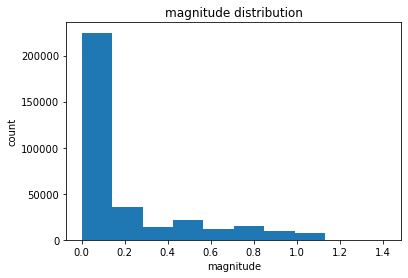

In [4]:
plt.title('magnitude distribution')
plt.xlabel('magnitude')
plt.ylabel('count')
plt.hist(mag_image.numpy().flatten())
plt.show()

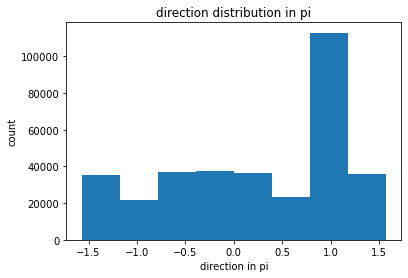

In [5]:
plt.title('direction distribution in pi')
plt.xlabel('direction in pi')
plt.ylabel('count')
plt.hist(dir_image.numpy().flatten(),bins=8)
plt.show()

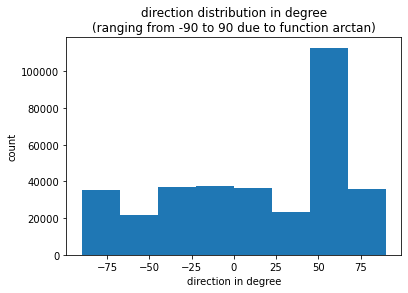

In [6]:
plt.title('direction distribution in degree\n(ranging from -90 to 90 due to function arctan)')
plt.xlabel('direction in degree')
plt.ylabel('count')
plt.hist((dir_image*180/torch.pi).numpy().flatten(),bins=8)
plt.show()

In [16]:
centers = torch.arange(0,8,dtype=float)*180/torch.pi
distri = torch.distributions.von_mises.VonMises(loc=centers, concentration=3)
p_distri = np.ones(8) / 8

raw_hist_image = torch.exp(distri.log_prob(dir_image[...,None]*2))
raw_hist_image = raw_hist_image * p_distri
raw_hist_image = raw_hist_image / raw_hist_image.sum(axis=-1,keepdim=True)

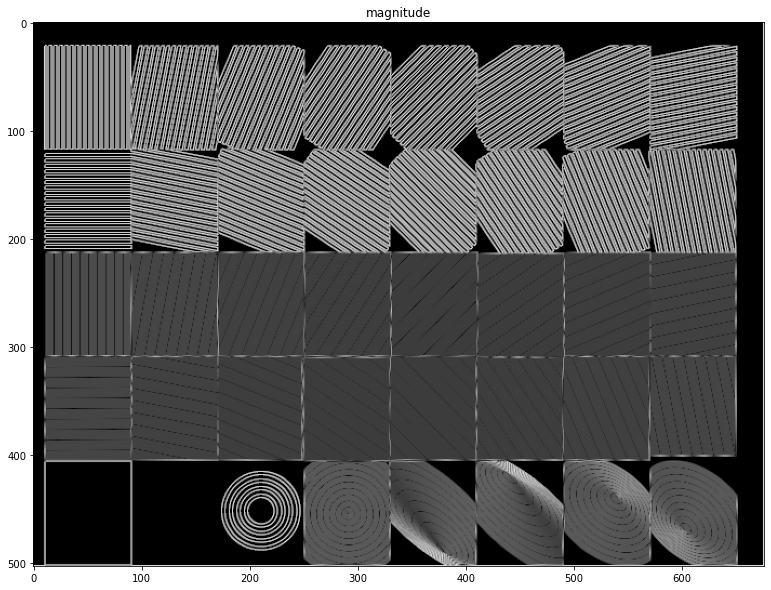

In [17]:
plt.figure(figsize=(20,10))
plt.title('magnitude')
plt.imshow(mag_image[0]**0.5,cmap='gray')
plt.show()

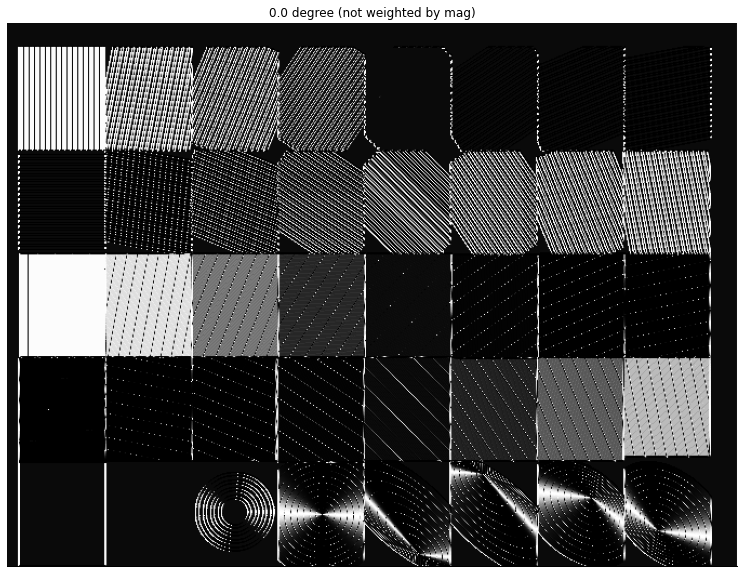

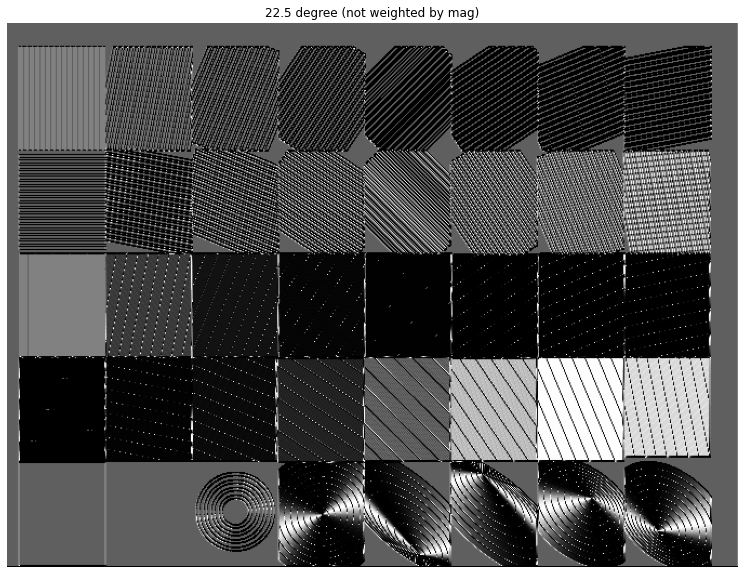

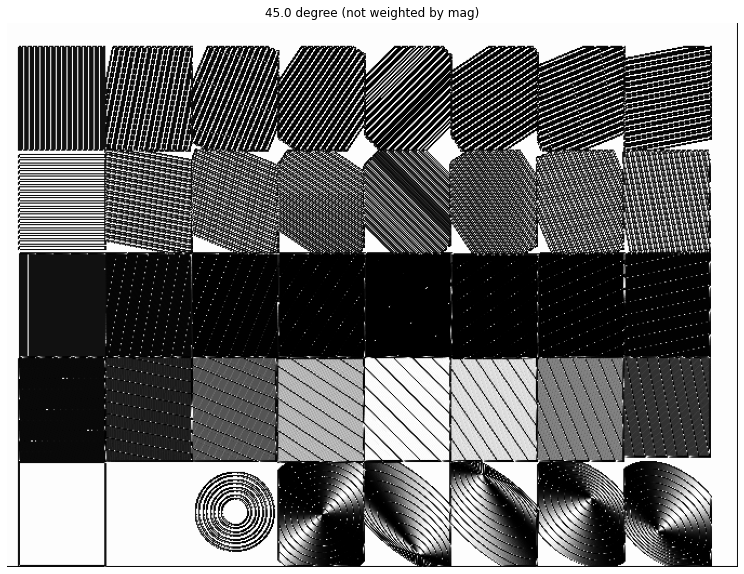

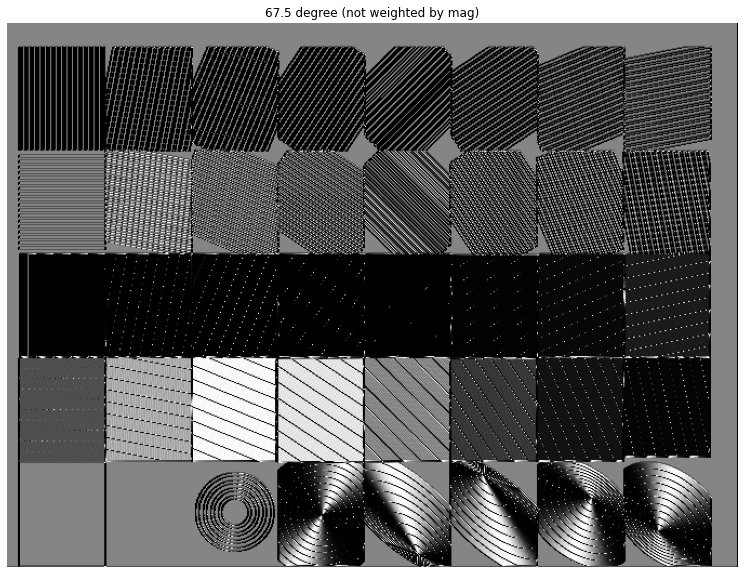

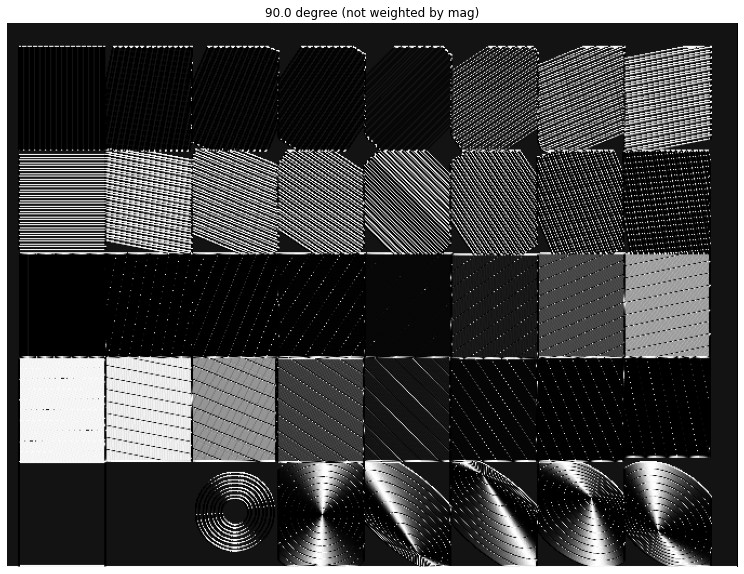

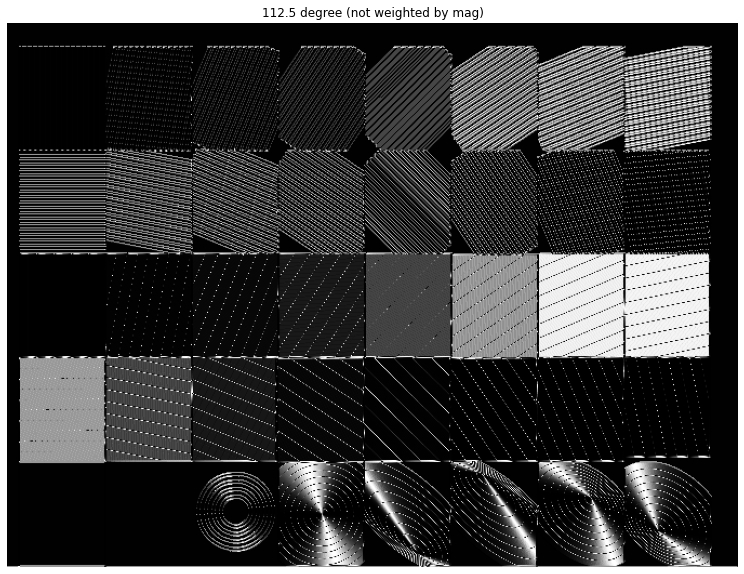

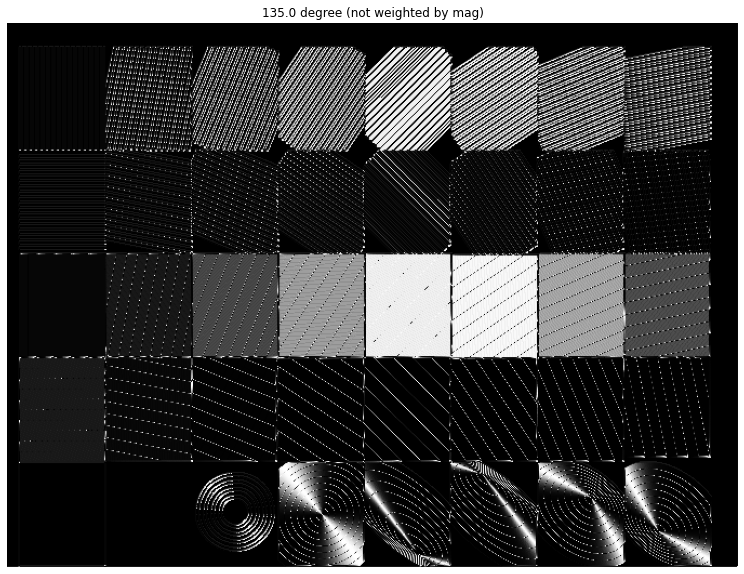

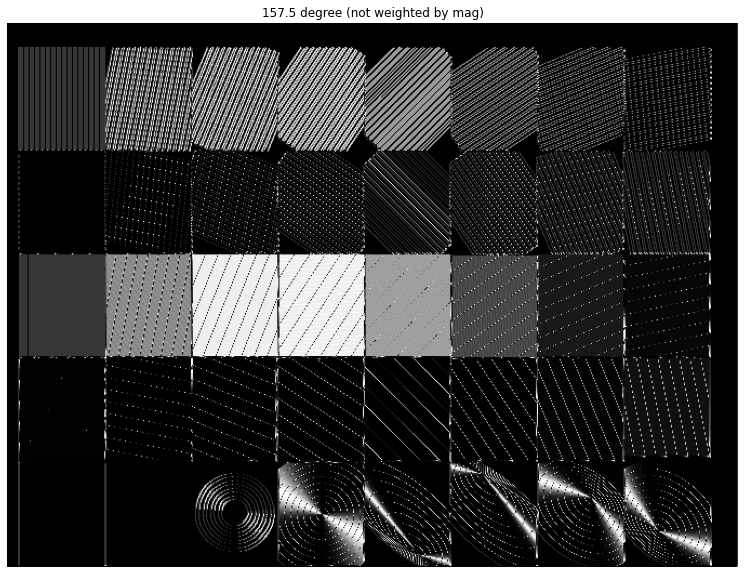

In [18]:
for i in range(8):
    plt.figure(figsize=(20,10))
    plt.title(f'{i*22.5} degree (not weighted by mag)')
    plt.imshow((raw_hist_image)[0,:,:,i],cmap='gray')
    plt.axis(False)
    plt.show()

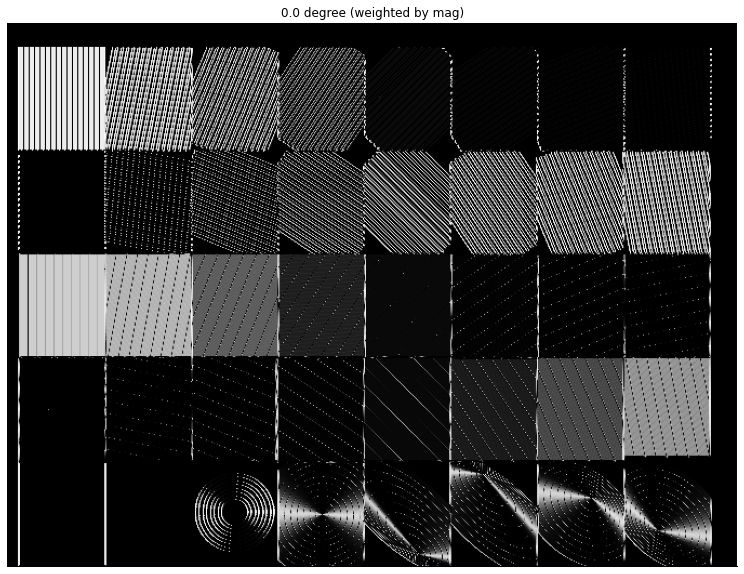

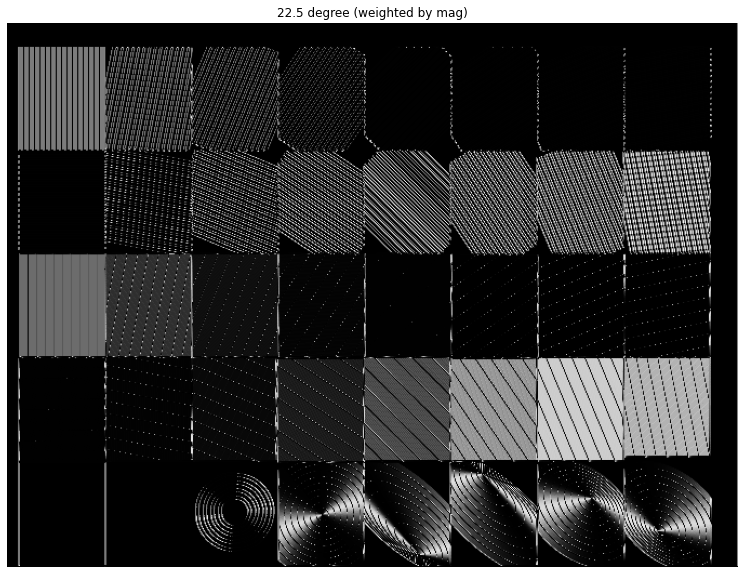

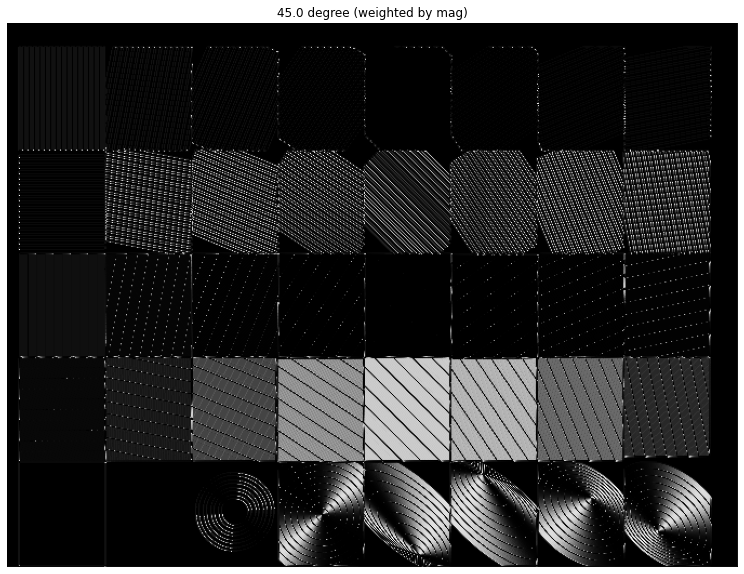

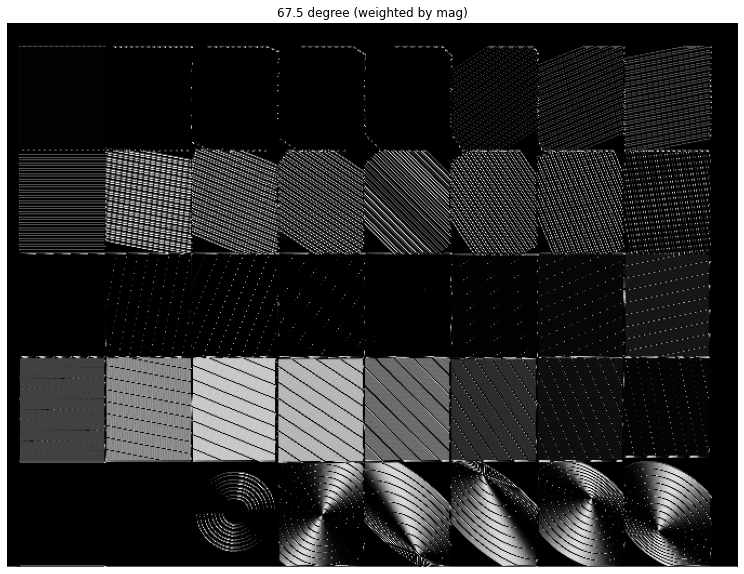

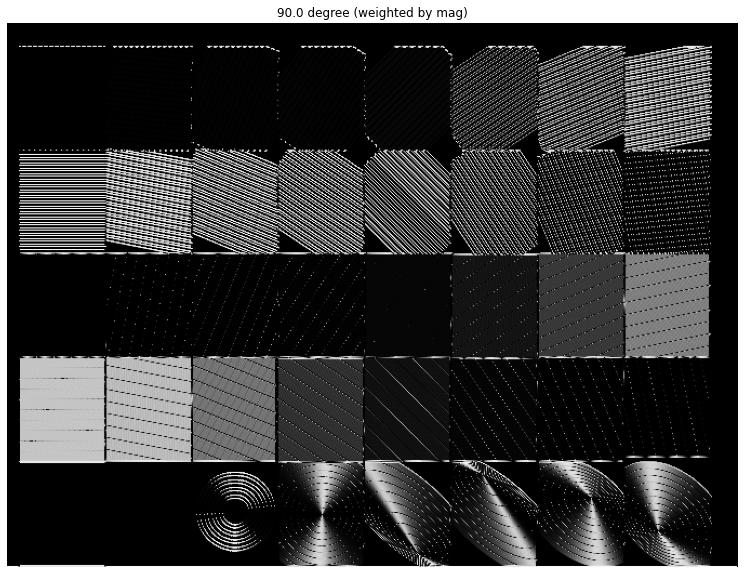

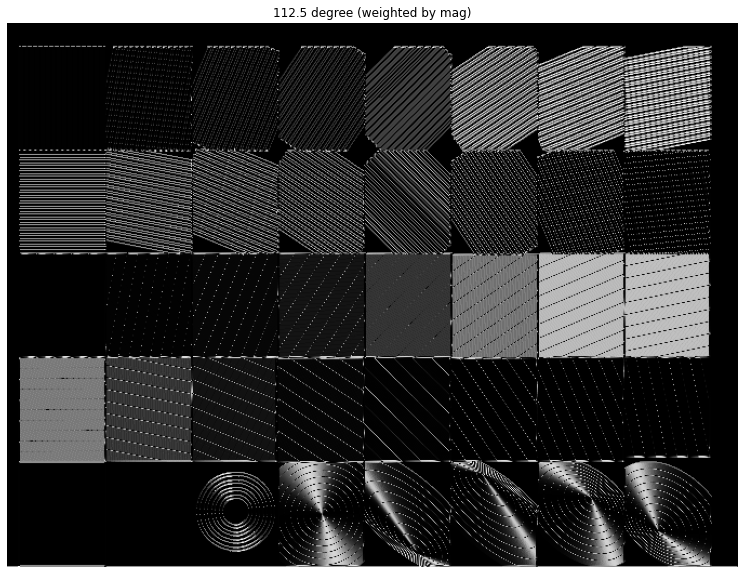

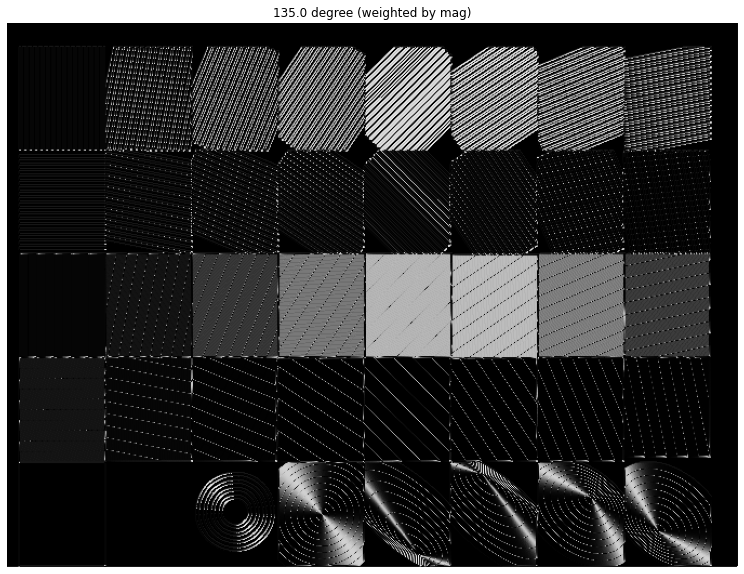

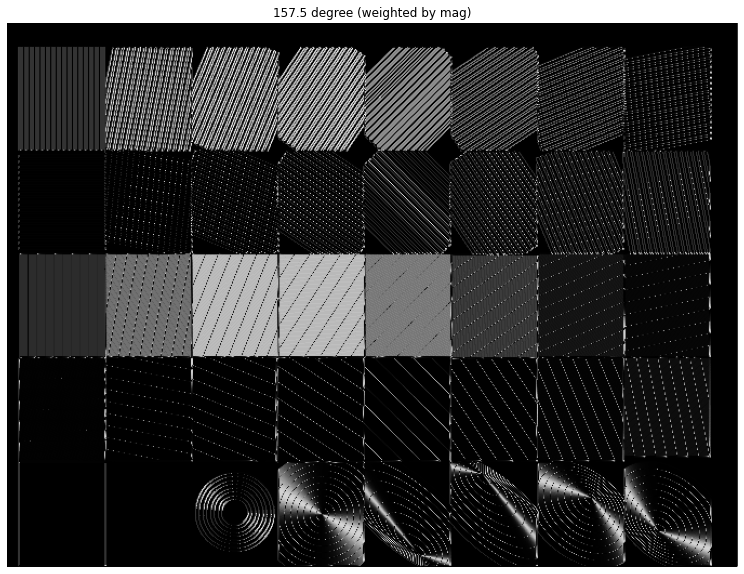

In [19]:
for i in range(8):
    plt.figure(figsize=(20,10))
    plt.title(f'{i*22.5} degree (weighted by mag)')
    plt.imshow((raw_hist_image*mag_image[...,None]**0.1)[0,:,:,i],cmap='gray')
    plt.axis(False)
    plt.show()